#🎯 “ORB: Velocidad y Precisión en la Detección de Características”

# ⛳"Detección de Características con ORB y Simulación de SLAM Visual"
 Curso: Visión por Computadora
 Docente: Elian Laura
 Integrantes - Grupo 7:
######      ✏ Aradiel Hilario:
######      ✏ García Fernando
######  ✏ Estacio Deiby:
######  ✏ Meza Moises:


---



#🧩 1. Introducción
1. ¿Qué es un detector de puntos clave y un descriptor?
2. Importancia en tareas como reconocimiento, stitching, SLAM.
3. ORB es una combinación de:
#### 3.1 FAST como detector (esquinas)
#### 3.2 BRIEF como descriptor (binario)
#### 3.3 Mejorado para ser invariante a rotación y escala

#📐 2. Invarianza a Escala y Rotación
## 🔄 Rotación:
ORB mejora BRIEF usando orientación de los keypoints:
1. Usa momento de primer orden para estimar ángulo.
2. Aplica una rotación al descriptor BRIEF según ese ángulo.

##📏 Escala:
Aunque FAST no es invariante a escala, ORB lo resuelve usando una pirámide de imágenes:
1. Detecta características en múltiples niveles de resolución.
2. Esto permite captar detalles en objetos grandes y pequeños.

| Método | Invarianza a Rotación | Invarianza a Escala |
| ------ | --------------------- | ------------------- |
| FAST   | ❌                     | ❌                   |
| BRIEF  | ❌                     | ❌                   |
| ORB    | ✅                     | ✅ (limitada)        |


# 🛠️ 3. Aplicaciones más adecuadas

* Sistemas en tiempo real (robótica, drones)
* SLAM (Simultaneous Localization and Mapping)
* Reconstrucción 3D
* Stitching de imágenes panorámicas
* Reconocimiento de objetos en dispositivos móviles

##### ✅ Ventaja: Funciona muy bien con restricciones de hardware (embedded systems)

# ⚙️ 4. Complejidad computacional

* ORB es rápido y ligero:
1. FAST: tiempo constante por píxel
2. BRIEF: operaciones binarias sobre vecindad → muy eficiente
3. ORB completo: O(n) en número de puntos

* Mucho más rápido que SIFT o SURF y libre de patentes

🛠️ 5. Flujo de trabajo (pipeline)

# 🧵 Configuración Previ
Acciones iniciales:
0. Conectar a Google Drive, cambiar de directorio.

In [5]:
import os
from google.colab import drive
drive.mount('/content/drive')

# Cambiar al directorio donde está la imagen (ajustar si es necesario)
os.chdir('/content/drive/MyDrive/MIA-UNI/3erCICLO/VisionComputador/Clase05/Tarea')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


✅ Imagen cargada: (1024, 1536)


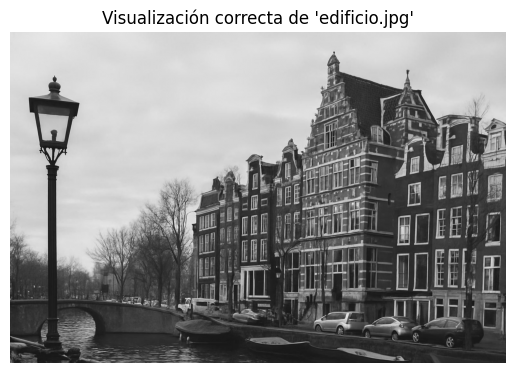

In [18]:
import cv2
import matplotlib.pyplot as plt

img = cv2.imread('edificio.jpg', cv2.IMREAD_GRAYSCALE)

if img is None:
    raise FileNotFoundError("⚠️ No se pudo cargar 'edificio.jpg'. Verifica la ruta.")
else:
    print("✅ Imagen cargada:", img.shape)
    plt.imshow(img, cmap='gray')
    plt.title("Visualización correcta de 'edificio.jpg'")
    plt.axis('off')
    plt.show()


In [19]:
print(img.min(), img.max())


0 255


# 🌟 ORB Feature Detection - Demostración Completa
Este notebook demuestra el uso del detector ORB incluyendo:
1. 🟢 Visualización de puntos clave
2. 🔷 Invarianza a la rotación
3. 🏷️ Comparación de velocidad con SIFT
4. 🧵 Stitching panorámico
5. 🤖 Comparación visual con otros detectores
6.  ✌ Aplicación potencial en SLAM


In [56]:
#Función para cargar imagenes - ahorra tiempo
import cv2
import numpy as np
import matplotlib.pyplot as plt
import time

def show_img(img, title=''):
    import matplotlib.pyplot as plt
    import numpy as np

    if img is None:
        raise ValueError("⚠️ La imagen está vacía (None). Verifica la ruta de carga.")

    plt.figure(figsize=(8, 6))

    if len(img.shape) == 2:  # Imagen en escala de grises
        plt.imshow(img, cmap='gray')
    elif img.shape[2] == 3:  # Imagen en color BGR -> RGB
        import cv2
        img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        plt.imshow(img_rgb)
    else:
        raise ValueError("❌ Formato de imagen no reconocido.")

    plt.title(title)
    plt.axis('off')
    plt.show()


def show_img_figsize(img, title='', figsize=(16,10)):
    import matplotlib.pyplot as plt
    import numpy as np

    if img is None:
        raise ValueError("⚠️ La imagen está vacía (None). Verifica la ruta de carga.")

    plt.figure(figsize=figsize)

    if len(img.shape) == 2:  # Imagen en escala de grises
        plt.imshow(img, cmap='gray')
    elif img.shape[2] == 3:  # Imagen en color BGR -> RGB
        import cv2
        img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        plt.imshow(img_rgb)
    else:
        raise ValueError("❌ Formato de imagen no reconocido.")

    plt.title(title)
    plt.axis('off')
    plt.show()



In [54]:
#cargando imágenes desde el disco en escala de grises, usando la función cv2.imread() de OpenCV.
img = cv2.imread('edificio.jpg', cv2.IMREAD_GRAYSCALE)
img_rot = cv2.imread('edificio_rotado.jpg', cv2.IMREAD_GRAYSCALE)
img1 = cv2.imread('paisaje1.jpg', cv2.IMREAD_GRAYSCALE) #IMAGEN 1
img2 = cv2.imread('paisaje2.jpg', cv2.IMREAD_GRAYSCALE) #IMAGEN 2 - ROTACIÓN DE LA ESCENA


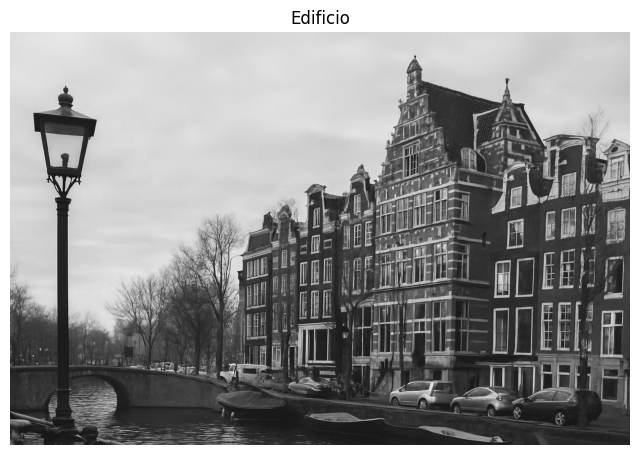

In [30]:
# Verificación de carga de imagenes
assert img1 is not None and img2 is not None, "❌ No se pudieron cargar las imágenes."
show_img(img, "Edificio")

## 🟢 1. Visualización de puntos clave

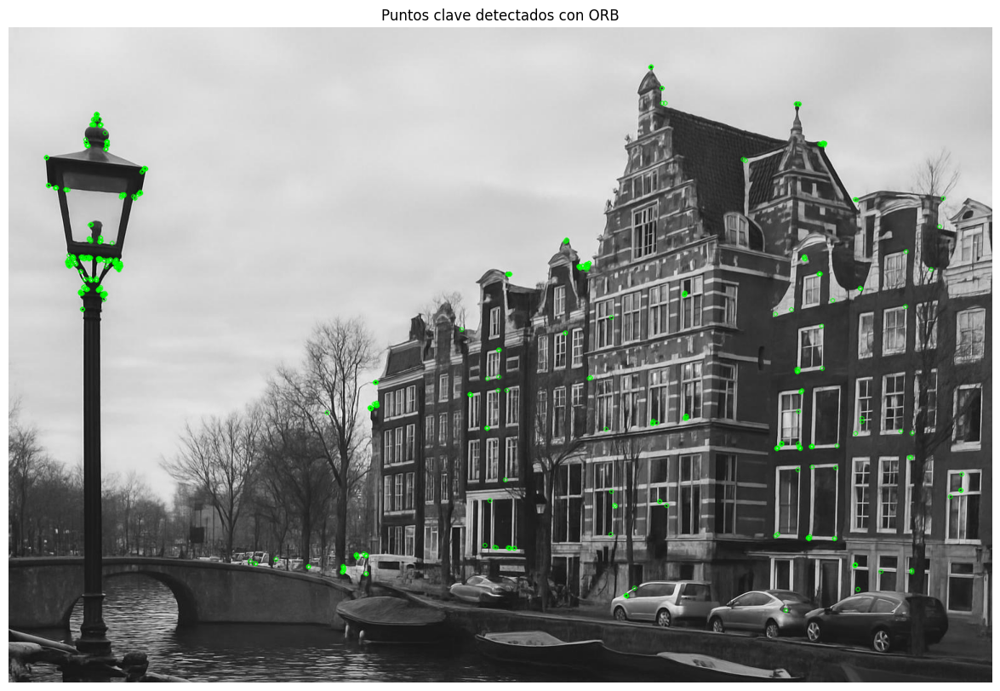

In [76]:

orb = cv2.ORB_create()

kp = orb.detect(img, None)
img_kp = cv2.drawKeypoints(img, kp, None, color=(0,255,0))
show_img_figsize(img_kp, 'Puntos clave detectados con ORB')


## 🔷 2. Invarianza a la rotación

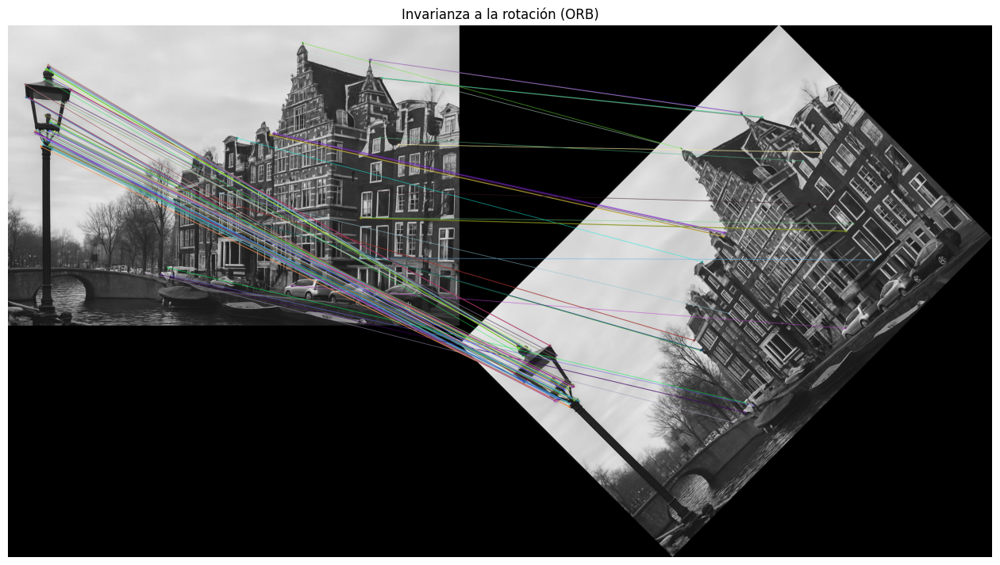

In [79]:
# Detectar puntos clave y descriptores en la imagen original y rotada
kp1, des1 = orb.detectAndCompute(img, None)
kp2, des2 = orb.detectAndCompute(img_rot, None)

# Crear el objeto de emparejamiento usando la distancia de Hamming (ideal para descriptores binarios como ORB)
bf = cv2.BFMatcher(cv2.NORM_HAMMING, crossCheck=True)

# Realizar el emparejamiento entre descriptores y Ordenar los matches por distancia: los mejores (más cercanos) primero
matches = bf.match(des1, des2)
matches = sorted(matches, key=lambda x: x.distance)

# Dibujar los primeros X matches entre la imagen original y la rotada
#matched_rot = cv2.drawMatches(img, kp1, img_rot, kp2, matches[:10], None, flags=2)
matched_rot = cv2.drawMatches(img, kp1, img_rot, kp2, matches[:150], None, flags=2)
#matched_rot = cv2.drawMatches(img, kp1, img_rot, kp2, matches[:50], None, flags=0)
show_img_figsize(matched_rot, 'Invarianza a la rotación (ORB)')

# 🏷️ 3.  Comparación de velocidad con SIFT

In [80]:
# Crear el detector SIFT (Scale-Invariant Feature Transform)
sift = cv2.SIFT_create()

# Medir el tiempo que tarda ORB en detectar y describir características
start = time.time()
kp_orb, des_orb = orb.detectAndCompute(img, None)
orb_time = time.time() - start  # Tiempo transcurrido para ORB

# Medir el tiempo que tarda SIFT en detectar y describir características
start = time.time()
kp_sift, des_sift = sift.detectAndCompute(img, None)
sift_time = time.time() - start  # Tiempo transcurrido para SIFT

# Mostrar los resultados de tiempo de ejecución
print(f"Tiempo ORB: {orb_time:.4f}s")
print(f"Tiempo SIFT: {sift_time:.4f}s")

Tiempo ORB: 0.0374s
Tiempo SIFT: 0.9757s


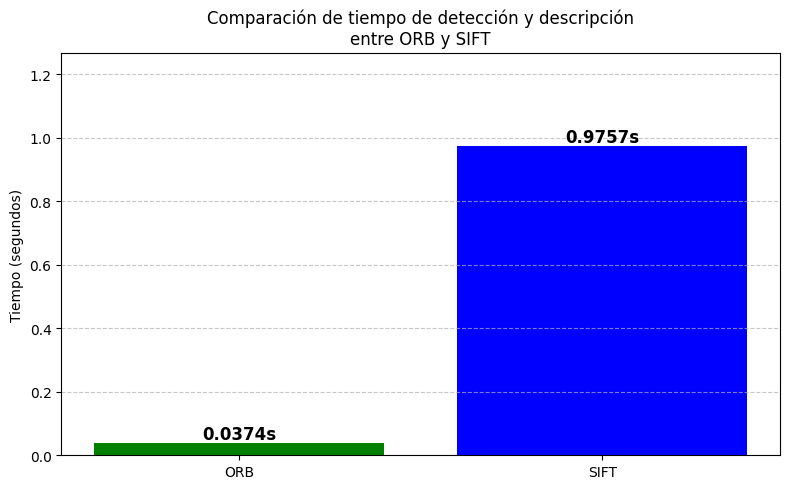

In [81]:
# Simulación de tiempos de ejecución para ORB y SIFT

# Crear una gráfica comparativa
algorithms = ['ORB', 'SIFT']
times = [orb_time, sift_time]

plt.figure(figsize=(8, 5))
bars = plt.bar(algorithms, times, color=['green', 'blue'])

# Añadir valores encima de las barras
for bar in bars:
    height = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2.0, height, f'{height:.4f}s',
             ha='center', va='bottom', fontsize=12, fontweight='bold')

plt.title('Comparación de tiempo de detección y descripción\nentre ORB y SIFT')
plt.ylabel('Tiempo (segundos)')
plt.ylim(0, max(times)*1.3)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

#🧵 4. Realizar stitching

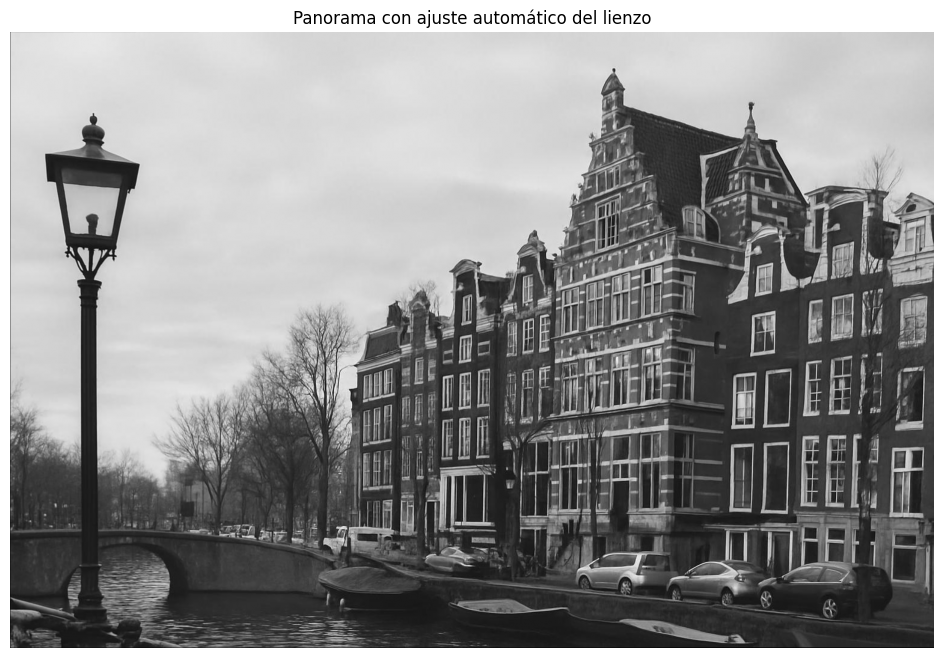

In [64]:
# Detección y emparejamiento
orb = cv2.ORB_create()
bf = cv2.BFMatcher(cv2.NORM_HAMMING, crossCheck=True)

kp1, des1 = orb.detectAndCompute(img1, None)
kp2, des2 = orb.detectAndCompute(img2, None)
matches = bf.match(des1, des2)

# Extraer puntos clave emparejados
src_pts = np.float32([kp1[m.queryIdx].pt for m in matches]).reshape(-1,1,2)
dst_pts = np.float32([kp2[m.trainIdx].pt for m in matches]).reshape(-1,1,2)

# Calcular homografía con RANSAC
H, _ = cv2.findHomography(src_pts, dst_pts, cv2.RANSAC, 5.0)

# Dimensiones de entrada
h1, w1 = img1.shape
h2, w2 = img2.shape

# Transformar las esquinas de img1
corners_img1 = np.float32([[0,0], [0,h1], [w1,h1], [w1,0]]).reshape(-1,1,2)
corners_img1_transformed = cv2.perspectiveTransform(corners_img1, H)

# Unir con esquinas de img2 (que no se transforman)
corners_img2 = np.float32([[0,0], [0,h2], [w2,h2], [w2,0]]).reshape(-1,1,2)
all_corners = np.concatenate((corners_img1_transformed, corners_img2), axis=0)

# Determinar el canvas de salida
[x_min, y_min] = np.int32(all_corners.min(axis=0).ravel() - 0.5)
[x_max, y_max] = np.int32(all_corners.max(axis=0).ravel() + 0.5)
translate = [-x_min, -y_min]

# Matriz de traslación para evitar coordenadas negativas
translation_matrix = np.array([
    [1, 0, translate[0]],
    [0, 1, translate[1]],
    [0, 0, 1]
])

# Aplicar la transformación a img1
result = cv2.warpPerspective(img1, translation_matrix @ H, (x_max - x_min, y_max - y_min))

# Insertar img2 en su posición correspondiente
result[translate[1]:translate[1]+h2, translate[0]:translate[0]+w2] = img2

show_img_figsize(result, 'Panorama con ajuste automático del lienzo',(16,8))

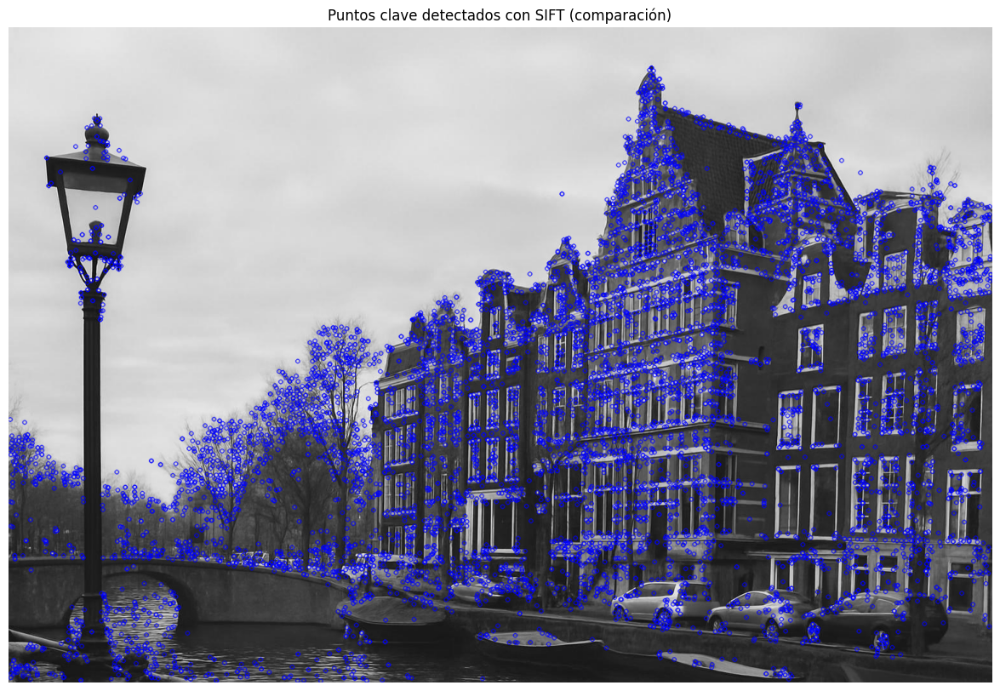

In [69]:

sift_kp = cv2.drawKeypoints(img, sift.detect(img, None), None, color=(255,0,0))
show_img_figsize(sift_kp, 'Puntos clave detectados con SIFT (comparación)',(16,10))


# 🤖 6. Simular movimiento SLAM

##Básico

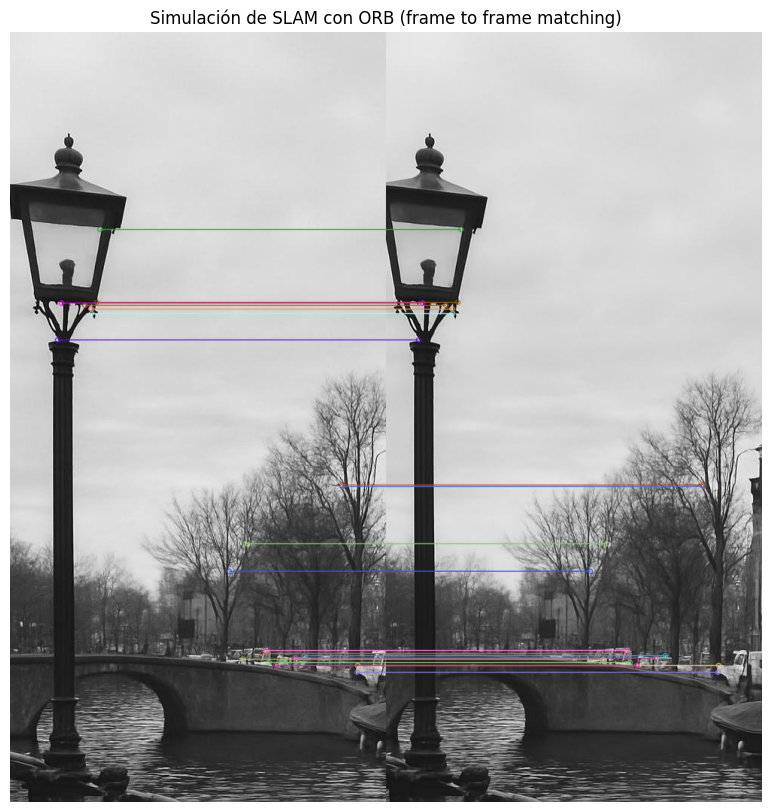

In [82]:

# Simulamos 2 frames de un SLAM básico
kp1, des1 = orb.detectAndCompute(img1, None)
kp2, des2 = orb.detectAndCompute(img2, None)
matches = bf.match(des1, des2)
matches = sorted(matches, key=lambda x: x.distance)
slam_sim = cv2.drawMatches(img1, kp1, img2, kp2, matches[:20], None, flags=2)
show_img_figsize(slam_sim, 'Simulación de SLAM con ORB (frame to frame matching)')


## 🚶‍♂️ Simulación de Movimiento tipo SLAM con Múltiples Frames

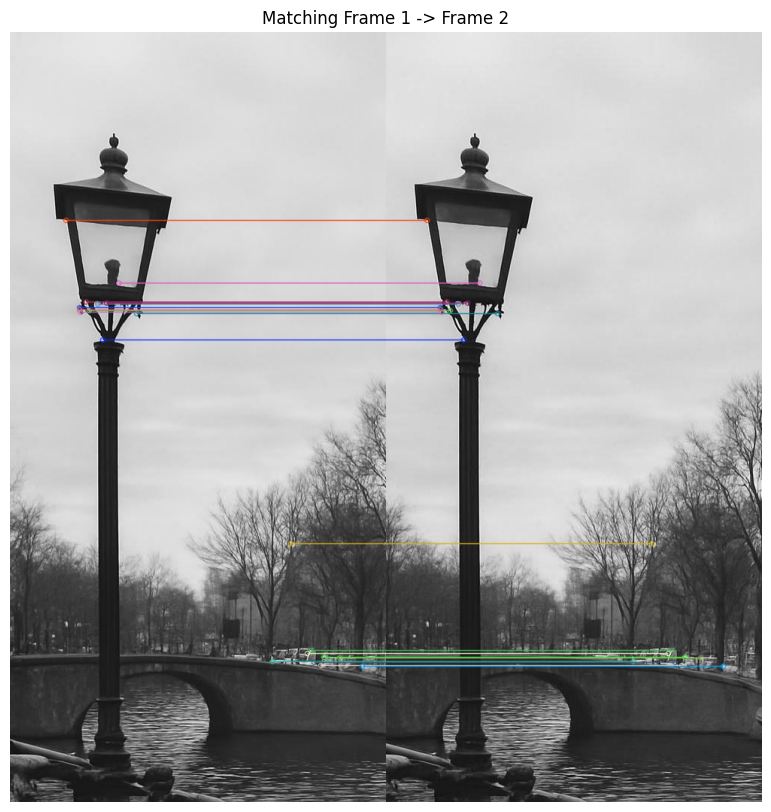

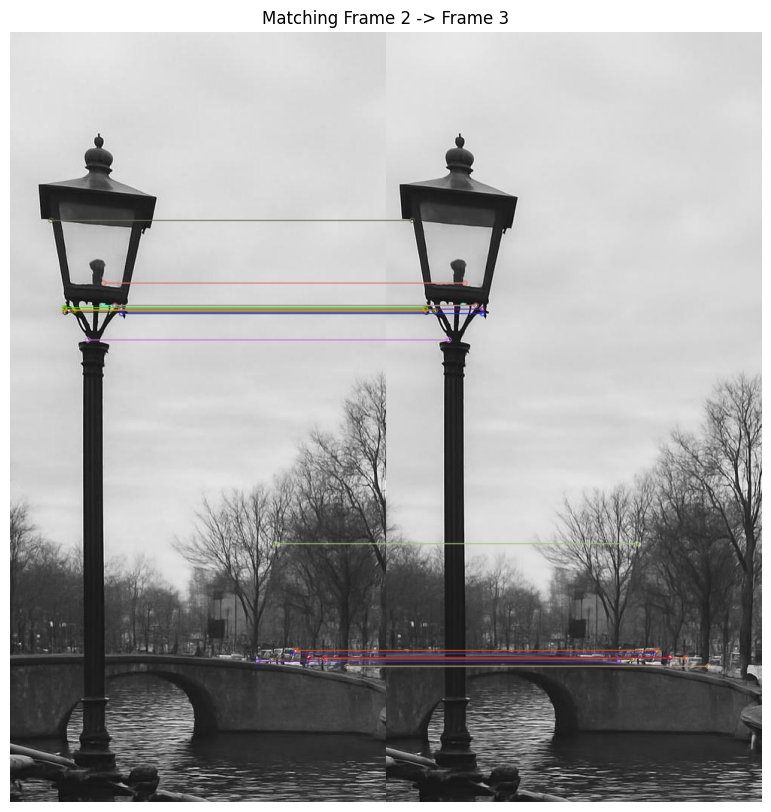

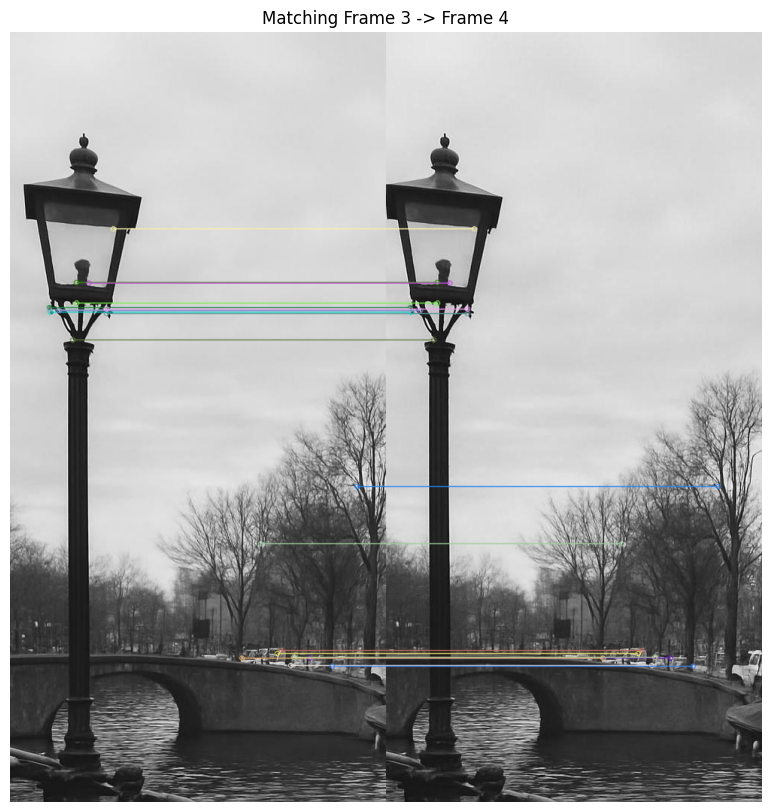

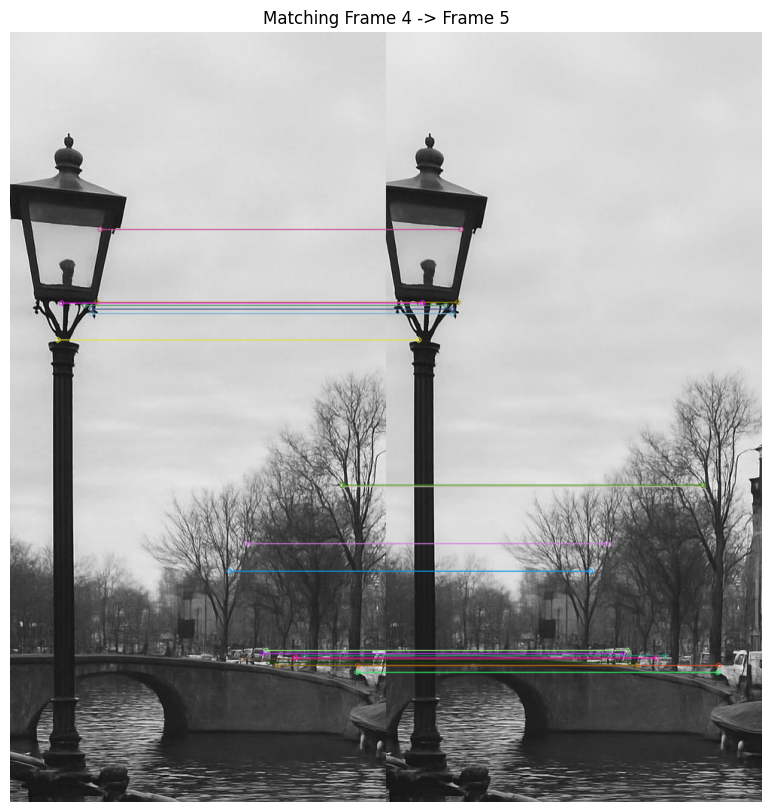

In [72]:

import cv2
import numpy as np
import matplotlib.pyplot as plt

orb = cv2.ORB_create()
bf = cv2.BFMatcher(cv2.NORM_HAMMING, crossCheck=True)

frames = []
for i in range(1, 6):
    frame = cv2.imread(f'frame_{i}.jpg', cv2.IMREAD_GRAYSCALE)
    frames.append(frame)

for i in range(len(frames) - 1):
    img1 = frames[i]
    img2 = frames[i + 1]

    kp1, des1 = orb.detectAndCompute(img1, None)
    kp2, des2 = orb.detectAndCompute(img2, None)
    matches = bf.match(des1, des2)
    matches = sorted(matches, key=lambda x: x.distance)

    matched = cv2.drawMatches(img1, kp1, img2, kp2, matches[:20], None, flags=2)
    show_img_figsize(matched, f'Matching Frame {i+1} -> Frame {i+2}')

### 🎞️ Animación del proceso tipo SLAM

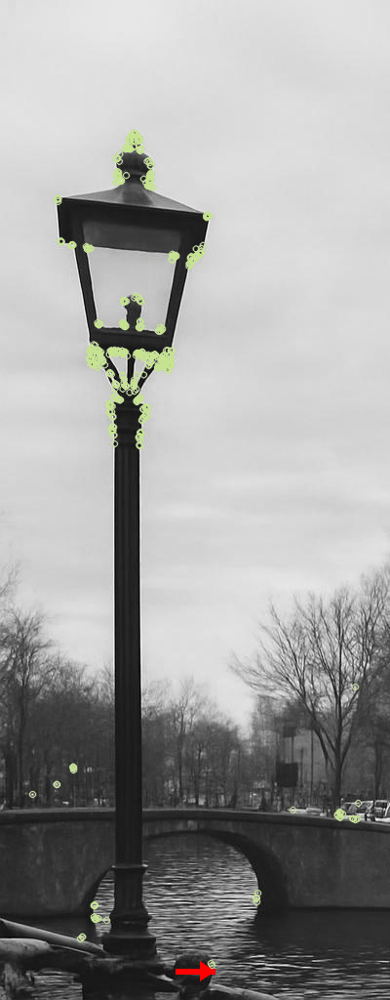

In [75]:
from IPython.display import Image
Image(filename="SLAM_robot_simulacion_flecha_fija.gif", width=350)

# ✅ Simulación SLAM + GIF con flecha roja

In [ ]:
import cv2
import numpy as np
from PIL import Image, ImageDraw
import imageio
import random

# Cargar imagen base
img_base = cv2.imread("edificio.jpg", cv2.IMREAD_GRAYSCALE)
frame_width = 400
step_size = 40
num_steps = (img_base.shape[1] - frame_width) // step_size

orb = cv2.ORB_create()
frames_with_arrows = []

for i in range(num_steps):
    x_start = i * step_size
    frame = img_base[:, x_start:x_start + frame_width]

    # Detectar keypoints con ORB
    kp = orb.detect(frame, None)
    color = tuple(random.choices(range(50, 255), k=3))
    frame_kp = cv2.drawKeypoints(frame, kp, None, color=color)

    # Convertir a RGB para usar PIL
    img_pil = Image.fromarray(cv2.cvtColor(frame_kp, cv2.COLOR_BGR2RGB))
    draw = ImageDraw.Draw(img_pil)

    # Flecha fija en la parte inferior central (simula dirección del robot)
    arrow_base = (frame_width // 2 - 20, frame.shape[0] - 30)
    arrow_tip = (arrow_base[0] + 40, arrow_base[1])
    draw.line([arrow_base, arrow_tip], fill=(255, 0, 0), width=6)

    # Dibujar cabeza de flecha
    arrow_size = 10
    arrow_pts = [
        arrow_tip,
        (arrow_tip[0] - 15, arrow_tip[1] - arrow_size),
        (arrow_tip[0] - 15, arrow_tip[1] + arrow_size)
    ]
    draw.polygon(arrow_pts, fill=(255, 0, 0))

    frames_with_arrows.append(img_pil)

# Guardar GIF final
frames_with_arrows[0].save(
    "SLAM_robot_simulacion_flecha_fija.gif",
    save_all=True,
    append_images=frames_with_arrows[1:],
    duration=600,
    loop=0
)
